# Libraries

### Import

In [ ]:
# skim dataframe
# library(skimr)

# tidyverse pakages
library(tidyverse)
# datetime
library(lubridate)

# wesanderson color palette
# library(wesanderson)


# visualization
# =============

# visualization
library(plotly)
# plot in grids
library(gridExtra)
# us map data
library(usmap)


# network analysis
# ================

# interactive network graph
# library(igraph)
# network analysis
# library(networkD3)


# nlp
# ===

# clean text
library(tidytext)
# term matrix
library(tm)
# snowball stemmer
library(SnowballC)
# word cloud
library(wordcloud)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

✔ ggplot2 3.3.2.9000     ✔ purrr   0.3.4     
✔ tibble  3.0.3          ✔ dplyr   1.0.0     
✔ tidyr   1.1.0          ✔ stringr 1.4.0     
✔ readr   1.3.1          ✔ forcats 0.5.0     

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


Attaching package: ‘lubridate’


The following objects are masked from ‘package:base’:

    date, intersect, setdiff, union



Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout


The following object is masked from ‘package:httr’:

    config



Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine


Loading required package: NLP


Attachi

### Theme

In [ ]:
# ggplot theme and font size
theme_set(theme_minimal(base_size = 18))

# figure size
options(repr.plot.width = 18, repr.plot.height = 7)

# Dataset

### Import

In [ ]:
# import data
df <- read.csv('..//input/air-passengers-and-departures-data-from-19702018/crashes.csv', 
               encoding='UTF-8', stringsAsFactors = FALSE)

# convert to a tible
df <- as_tibble(df)

# store summary column separately
summary <- df %>%
    select(Summary)

# set df equal to all columns except summary
# df <- df %>%
#     select(-Summary)

In [ ]:
# first few rows
head(df)

Date,Time,Location,Operator,Flight..,Route,AC..Type,Registration,cn...ln,Total.Aboard,Passengers.Aboard,Crew.Aboard,Total.Fatalities,Passengers.Fatalities,Crew.Fatalities,Ground,Summary
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>
"September 17, 1908",17:18,"Fort Myer, Virginia",Military - U.S. Army,,Demonstration,Wright Flyer III,,1,2,1,1,1,1,0,0,"During a demonstration flight, a U.S. Army flyer flown by Orville Wright nose-dived into the ground from a height of approximately 75 feet, killing Lt. Thomas E. Selfridge, 26, who was a passenger. This was the first recorded airplane fatality in history. One of two propellers separated in flight, tearing loose the wires bracing the rudder and causing the loss of control of the aircraft. Orville Wright suffered broken ribs, pelvis and a leg. Selfridge suffered a crushed skull and died a short time later."
"September 07, 1909",,"Juvisy-sur-Orge, France",,,Air show,Wright Byplane,SC1,,1,0,1,1,0,0,0,"Eugene Lefebvre was the first pilot to ever be killed in an air accident, after his controls jambed while flying in an air show."
"July 12, 1912",06:30,"Atlantic City, New Jersey",Military - U.S. Navy,,Test flight,Dirigible,,,5,0,5,5,0,5,0,"First U.S. dirigible Akron exploded just offshore at an altitude of 1,000 ft. during a test flight."
"August 06, 1913",,"Victoria, British Columbia, Canada",Private,,,Curtiss seaplane,,,1,0,1,1,0,1,0,"The first fatal airplane accident in Canada occurred when American barnstormer, John M. Bryant, California aviator was killed."
"September 09, 1913",18:30,Over the North Sea,Military - German Navy,,,Zeppelin L-1 (airship),,,20,NA,NA,14,NA,NA,0,The airship flew into a thunderstorm and encountered a severe downdraft crashing 20 miles north of Helgoland Island into the sea. The ship broke in two and the control car immediately sank drowning its occupants.
"October 17, 1913",10:30,"Near Johannisthal, Germany",Military - German Navy,,,Zeppelin L-2 (airship),,,30,NA,NA,30,NA,NA,0,"Hydrogen gas which was being vented was sucked into the forward engine and ignited causing the airship to explode and burn at 3,000 ft.."


In [ ]:
# no. of rows and columns of the data
dim(df)

[1] 4983   17

In [ ]:
# columns in the dataset
colnames(df)

[1] "Date"                  "Time"                  "Location"             
 [4] "Operator"              "Flight.."              "Route"                
 [7] "AC..Type"              "Registration"          "cn...ln"              
[10] "Total.Aboard"          "Passengers.Aboard"     "Crew.Aboard"          
[13] "Total.Fatalities"      "Passengers.Fatalities" "Crew.Fatalities"      
[16] "Ground"                "Summary"

### Columns

> * Date - Date of accident
> * Time - Local time, in 24 hr. in the format hh:mm
> * Location - Location of the accident
> * Operator - Airline or operator of the aircraft
> * Flight -  Flight number assigned by the aircraft operator
> * Route - Complete or partial route flown prior to the accident
> * Type - Aircraft type
> * Registration - ICAO registration of the aircraft
> * cn/In - Construction or serial number / Line or fuselage number
> * Total Aboard - Total people aboard
> * Passengers Aboard - Passengers aboard
> * Crew Aboard - Crew aboard
> * Total Fatalities - Total fatalities
> * Passengers Fatalities - Passengers fatalities
> * Crew Fatalities - Crew fatalities
> * Ground - Total killed on the ground
> * Summary - Brief description of the accident and cause if known

### Dataset properties

In [ ]:
# sturcutre of the dataset
# str(df)

In [ ]:
# skim dataframe
# skim(df)

In [ ]:
# glimpse
# glimpse(df)

In [ ]:
# summary of the dataset
# summary(df)

### Missing and unique values

In [ ]:
# no. of missing values / empty strings in each columns
missing_values <- sapply(df, function(y) sum(length(which(y == ''))))
data.frame(missing_values)

,missing_values
,<int>
Date,0
Time,1539
Location,5
Operator,10
Flight..,3663
Route,762
AC..Type,14
Registration,271
cn...ln,663


In [ ]:
# no. of NA values in each columns
na_count <- sapply(df, function(x) sum(is.na(x)))
data.frame(na_count)

,na_count
,<int>
Date,0
Time,0
Location,0
Operator,0
Flight..,0
Route,0
AC..Type,0
Registration,0
cn...ln,0


In [ ]:
# no. of unique values in each column
unique_values <- sapply(df, function(x) length(unique(x)))
data.frame(unique_values)

,unique_values
,<int>
Date,4555
Time,1065
Location,4095
Operator,2248
Flight..,889
Route,3817
AC..Type,2438
Registration,4677
cn...ln,3886


# Preprocessing

In [ ]:
# replace NA with 0
df[is.na(df)] <- 0

In [ ]:
# rename column names
colnames(df) <- c('Date', 'Time', 'Location', 'Operator', 'Flight', 'Route', 'Type', 
                  'Registration', 'cn/ln', 'Total_Aboard', 'Passengers_Aboard', 
                  'Crew_Aboard', 'Total_Fatalities', 'Passengers_Fatalities', 
                  'Crew_Fatalities', 'Ground', 'Summary')

In [ ]:
# convert to proper date and time format
df$Date <- mdy(df$Date)
df$Time <- hm(df$Time)

Warning message in .parse_hms(..., order = "HM", quiet = quiet):
“Some strings failed to parse, or all strings are NAs”


# Feature Engineering

In [ ]:
# extracting additional informations
# ==================================

# get year, month, day, weekday, week no., quarter from the 'Date' column
df$Year <- year(df$Date)
df$Month <- as.factor(month(df$Date))
df$Day <- as.factor(day(df$Date))
df$Weekday <- as.factor(wday(df$Date))
df$Week_no <- as.factor(week(df$Date))
df$Quarter <- as.factor(quarter(df$Date))
df$Is_Leap_Year <- leap_year(df$Date)
df$Decade <- year(floor_date(df$Date, years(10)))

# get hour, minute is_am from 'Time' column
df$Hour <- as.integer(hour(df$Time))
df$Minute <- as.factor(minute(df$Time))
df$AM_PM <- if_else(am(df$Time), 'AM', 'PM')
df$btwn_6PM_6AM <- if_else(df$Hour <= 6 | df$Hour >= 18, '6PM-6AM', '6AM-6PM')

# filter out rows with wrong hour data
df <- df %>% filter(Hour<=24)

# final dataset
head(df, 3)

Date,Time,Location,Operator,Flight,Route,Type,Registration,cn/ln,Total_Aboard,⋯,Day,Weekday,Week_no,Quarter,Is_Leap_Year,Decade,Hour,Minute,AM_PM,btwn_6PM_6AM
<date>,<Period>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,⋯,<fct>,<fct>,<fct>,<fct>,<lgl>,<dbl>,<int>,<fct>,<chr>,<chr>
1908-09-17,17H 18M 0S,"Fort Myer, Virginia",Military - U.S. Army,,Demonstration,Wright Flyer III,,1,2,⋯,17,5,38,3,TRUE,1900,17,18,PM,6AM-6PM
1912-07-12,6H 30M 0S,"Atlantic City, New Jersey",Military - U.S. Navy,,Test flight,Dirigible,,,5,⋯,12,6,28,3,TRUE,1910,6,30,AM,6PM-6AM
1913-09-09,18H 30M 0S,Over the North Sea,Military - German Navy,,,Zeppelin L-1 (airship),,,20,⋯,9,3,36,3,FALSE,1910,18,30,PM,6PM-6AM


# Exploring the availabe Dataset

## 1. Exploring Date and time information

In [ ]:
# year wise
year_wise <- df %>% count(Year)

# day wise
day_wise <- df %>% count(Day) 

# week day wise
week_day_wise <- df %>% count(Weekday)

# month wise
month_wise <- df %>% count(Month)

# week no. wise
week_no_wise <- df %>% count(Week_no)

# quarter wise
q_wise <- df %>% count(Quarter)

# hour wise
hour_wise <- df %>% count(Hour)

# AM-PM wise
am_pm_wise <- df %>% count(AM_PM)

# AM-PM wise
btwn_6PM_6AM_wise <- df %>% count(btwn_6PM_6AM)

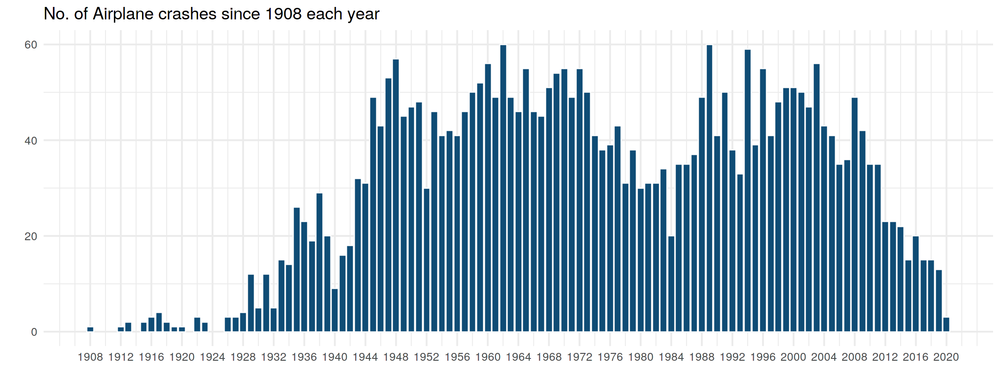

In [ ]:
# year wise
ggplot(year_wise, aes(x = Year, y = n)) +
    geom_col(fill = '#0f4c75', col = 'white') +
    labs(title = 'No. of Airplane crashes since 1908 each year', x = '', y = '') +
    scale_x_continuous(breaks = seq(1908, 2020, 4))

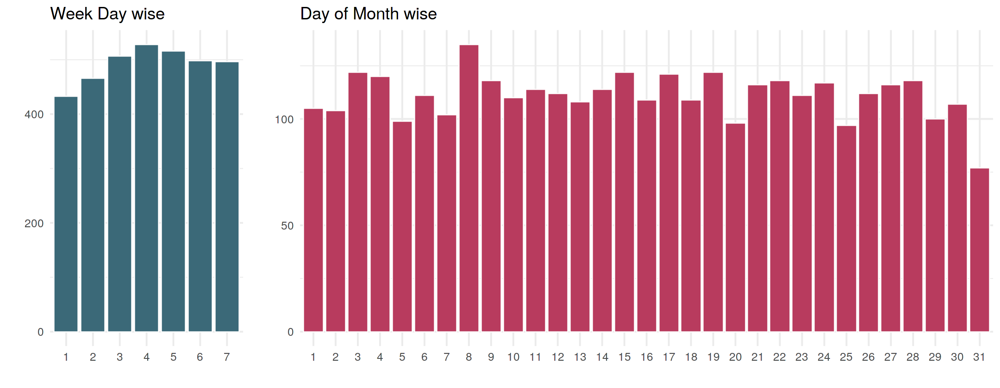

In [ ]:
# weekday
wd <- ggplot(week_day_wise, aes(x = Weekday, y = n)) +
    geom_col(fill = '#3b6978', col = 'white')+
    labs(title = 'Week Day wise', x = '', y = '')

# day wise
d <- ggplot(day_wise, aes(x = Day, y = n)) +
    geom_col(fill = '#b83b5e', col = 'white')+
    labs(title = 'Day of Month wise', x = '', y = '')

# plot
grid.arrange(wd, d, nrow = 1, widths = c(1, 3))

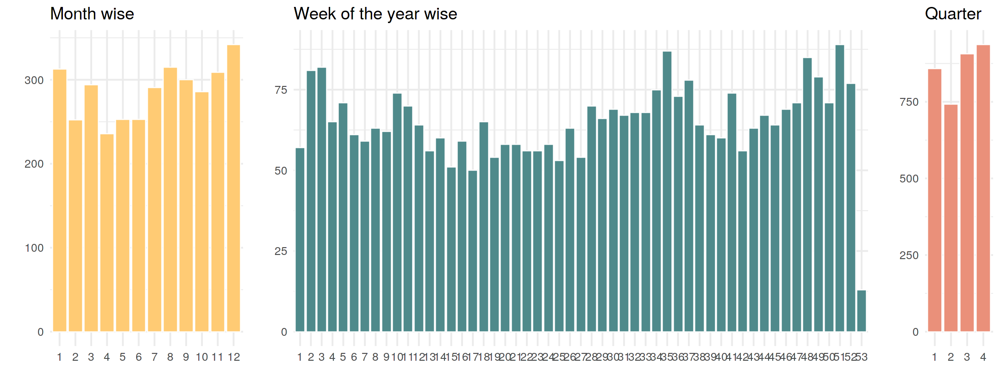

In [ ]:
# month
m <- ggplot(month_wise, aes(x = Month, y = n)) +
    geom_col(fill = '#ffcb74', col = 'white') +
    labs(title = 'Month wise', x = '', y = '')

# week no.
wn <- ggplot(week_no_wise, aes(x = Week_no, y = n)) +
    geom_col(fill = '#4f8a8b', col = 'white') +
    labs(title = 'Week of the year wise', x = '', y = '') 

# quarter
q <- ggplot(q_wise, aes(x = Quarter, y = n)) +
    geom_col(fill = '#ea907a', col = 'white') +
    labs(title = 'Quarter', x = '', y = '')

# plot
grid.arrange(m, wn, q, nrow = 1, widths = c(2, 5, 1))

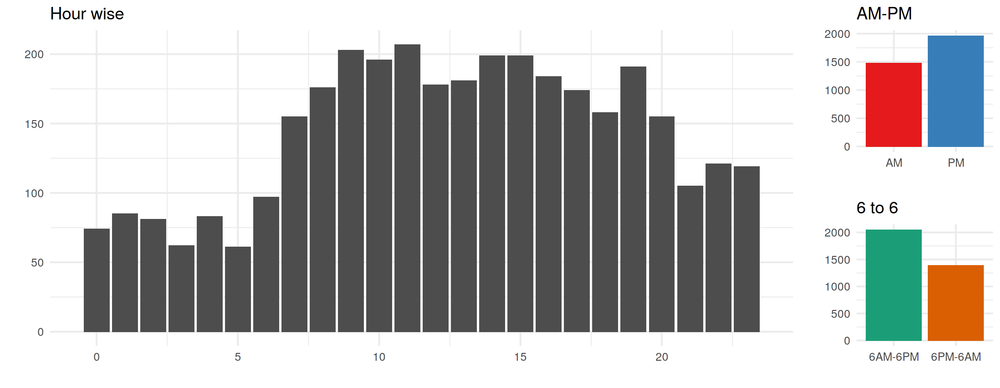

In [ ]:
# hour graph
h <- ggplot(hour_wise, aes(x = Hour, y = n)) +
    geom_col(fill = 'gray30') +
    labs(title = 'Hour wise', x = '', y = '')
                        
# am-pm graph
a <- ggplot(am_pm_wise, aes(x = AM_PM, y = n, fill = AM_PM)) +
    geom_col() + 
    labs(title = 'AM-PM', x = '', y = '') +
    scale_fill_brewer(palette = "Set1") +
    theme(legend.position = "none") 

# am-pm graph
n <- ggplot(btwn_6PM_6AM_wise, aes(x = btwn_6PM_6AM, y = n, fill = btwn_6PM_6AM)) +
    geom_col() +
    labs(title = '6 to 6', x = '', y = '') +
    scale_fill_brewer(palette = "Dark2") + 
    theme(legend.position = "none") 

# plot
grid.arrange(h, a, n, nrow = 1, layout_matrix = rbind(c(1,1,1,1,2),
                                                      c(1,1,1,1,3)))

## 2. Type
> From the type column we can get the model as well as manufacturer of the air planes

In [ ]:
# Type/Model
# ==========

# group by Type column
type_wise <- df %>%
     count(Type, sort = TRUE)

# top values in Type columns
# head(type_wise)

In [ ]:
# manufacturer
# ============

# extract and group by manufacturer
main_type_wise <- df %>%
    # replace model number by empty strings
    mutate(main_type = str_replace_all(Type, "[A-Za-z]*-?\\d+-?[A-Za-z]*.*", "")) %>% 
    count(main_type, sort = TRUE) %>%
    # skip empty strings row
    filter(main_type > 'A') 

# top values
# head(main_type_wise)

In [ ]:
# decade wise
# ============

# extract and group by manufacturer
main_type_wise_decade <- df %>%
    select(Decade, Type) %>%
    # replace model number by empty strings
    mutate(main_type = str_replace_all(Type, "[A-Za-z]*-?\\d+-?[A-Za-z]*.*", "")) %>% 
    # skip empty strings row
    filter(main_type > 'A') %>%
    group_by(Decade, main_type) %>%
    summarize(n = n()) %>%
    group_by(Decade) %>%
    top_n(3, n) %>% 
    mutate(main_type = reorder_within(main_type, n, Decade))

# top values
# head(main_type_wise_decade)

`summarise()` regrouping output by 'Decade' (override with `.groups` argument)



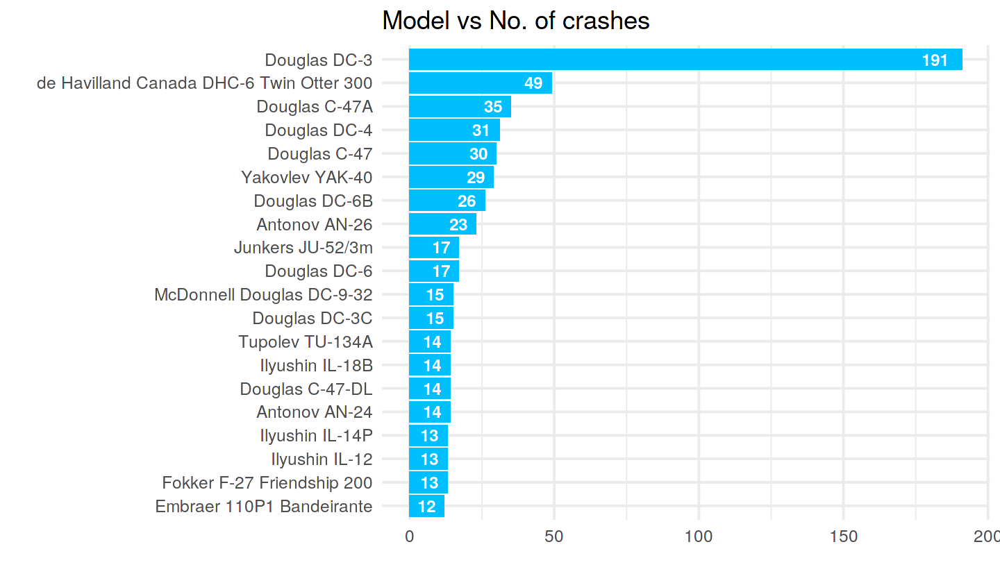

In [ ]:
# figure size
options(repr.plot.width = 12)

# most frequent value in Type column
ggplot(head(type_wise, 20), aes(reorder(Type, n) , n, fill = n)) +
    geom_col(fill = 'deepskyblue1') +  
    geom_text(aes(label = n), hjust = 1.5, colour = "white", size = 5, fontface = "bold") +
    labs(title = 'Model vs No. of crashes', x = '', y = '') +
    coord_flip()

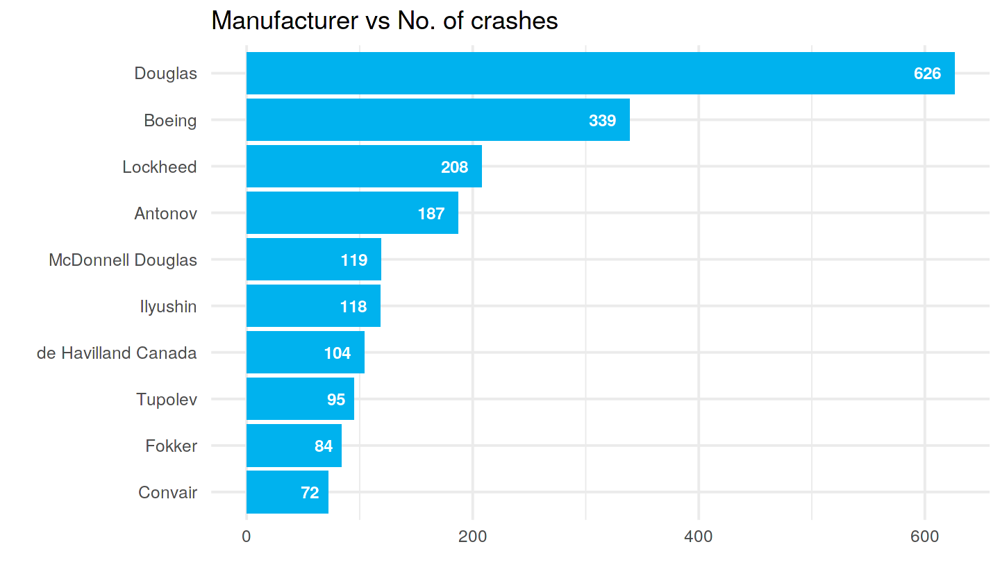

In [ ]:
# plot top manufacturer values
ggplot(head(main_type_wise, 10), aes(reorder(main_type, n), n, fill = n)) +
    geom_col(fill = 'deepskyblue2') +
    geom_text(aes(label = n), hjust = 1.5, colour = "white", size = 5, fontface = "bold") +
    labs(title = 'Manufacturer vs No. of crashes', x = '', y = '')+    
    coord_flip()

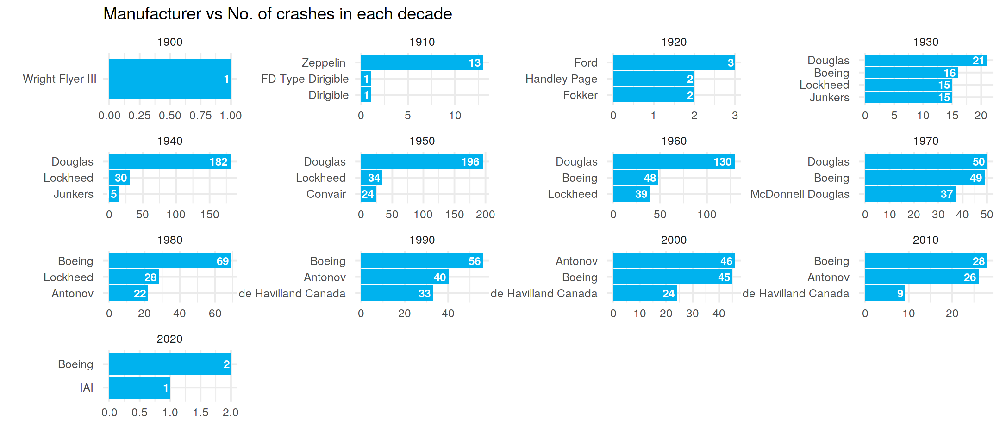

In [ ]:
# figure size
options(repr.plot.width = 18, repr.plot.height = 8)

# plot top manufacturer values
ggplot(main_type_wise_decade, aes(main_type, n)) +
    geom_col(fill = 'deepskyblue2') +
    facet_wrap(~ Decade, scales = "free") +
    geom_text(aes(label = n), hjust = 1.2, colour = "white", size = 5, fontface = "bold") +
    labs(title = 'Manufacturer vs No. of crashes in each decade', x = '', y = '')+    
    coord_flip() +
    scale_x_reordered()

## 3. Operator
> Operator could be a
> *     Commercial airline
> *     Military / Force
> *     Private 
> *     Other (Need to look at the data)

In [ ]:
# table - military or non-military
# pie - military or non-military

In [ ]:
# most frequent value in Operator column
# ======================================

operator_wise <- df %>%
    count(Operator, sort = TRUE)

# head(operator_wise)

In [ ]:
# Commercial Operator table
# =========================

main_op_wise <- df %>%
    # replace all group of words followed by '-'
    mutate(main_op = str_replace_all(Operator, ' -.*', '')) %>% 
    filter(!str_detect(main_op, '[Mm]ilitary')) %>%
    filter(!str_detect(main_op, 'Private')) %>%
    count(main_op, sort = TRUE) %>%
    filter(main_op > 'A') 

# first few rows
# head(main_op_wise)

In [ ]:
# force / military
# ================

# extracting military flights data
force <- operator_wise %>%
    filter(str_detect(Operator, '[Mm]ilitary')) %>%
    mutate(op = str_replace_all(Operator, 'Military ?-? ?', '')) %>%
    count(op, sort = TRUE)

# first few rows
head(force)

Using `n` as weighting variable
ℹ Quiet this message with `wt = n` or count rows with `wt = 1`



op,n
<chr>,<int>
U.S. Air Force,99
U.S. Army Air Forces,40
Royal Air Force,30
U.S. Navy,26
U.S. Army,21
German Navy,13


In [ ]:
# which country's military/force
# ==============================

force_country <- operator_wise %>%
    # get rows containing string 'military'
    filter(str_detect(Operator, 'Military|military')) %>%
    # replace strings part
    mutate(op = str_replace_all(Operator, 'Royal Air Force', 'UK')) %>%
    mutate(op = str_replace_all(op, 'Military ?-? ?|Royal', '')) %>%
    mutate(op = str_replace_all(op, ' (Navy|Army|Air|Maritime Self Defense|Marine Corps|Naval|Defence|Armed) ?.*', '')) %>%
    mutate(op = str_replace_all(op, '.*U\\.? ?S\\.?.*|United States|American', 'USA')) %>%
    mutate(op = str_replace_all(op, 'Aeroflot ?/? ?', '')) %>%
    mutate(op = str_replace_all(op, '.*Republic? ?of', '')) %>%
    mutate(op = str_replace_all(op, '.*British.*', 'UK')) %>%
    mutate(op = str_replace_all(op, '.*Indian.*', 'Indian')) %>%
    mutate(op = str_replace_all(op, '.*Chin.*', 'Chinese')) %>%
    mutate(op = str_replace_all(op, '.*Chilean.*', 'Chilian')) %>%
    mutate(op = str_replace_all(op, '.*Iran.*', 'Iran')) %>%
    mutate(op = str_replace_all(op, '.*French.*', 'French')) %>%
    mutate(op = str_replace_all(op, '.*Ecuador.*', 'Ecuadorean')) %>%
    mutate(op = str_replace_all(op, '.*Zambia.*', 'Zambian')) %>%
    mutate(op = str_replace_all(op, '.*Russia.*', 'Russian')) %>%
    mutate(op = str_replace_all(op, '.*Afghan.*', 'Afghan')) %>%
    group_by(op) %>%
    summarize(n = sum(n)) %>%
    arrange(desc(n)) 


# first few rows
head(force_country)

`summarise()` ungrouping output (override with `.groups` argument)



op,n
<chr>,<int>
USA,227
UK,34
Russian,16
German,13
Iran,12
French,9


In [ ]:
# military vs non-military flights
yr_military <- df %>%
    select(Year, Operator) %>%
    mutate(Is_Military = str_detect(Operator, 'Military|military')) %>%
    group_by(Year, Is_Military) %>%
    summarize(n = n())

# first few rows
# head(yr_military)

`summarise()` regrouping output by 'Year' (override with `.groups` argument)



In [ ]:
# during world war

ww <- df %>%
    select(Year, Operator) %>%
    filter(str_detect(Operator, 'Military|military')) %>%
    filter(Year >= 1914, Year <= 1945) %>%
    mutate(Operator = str_replace_all(Operator, 'Military ?-? ?|Royal', '')) %>%
    mutate(Operator = str_replace_all(Operator, 'American', 'U.S.')) %>%
    mutate(Operator = str_replace_all(Operator, ' (Army|Navy|Air) ?.*', '')) %>%
    mutate(Operator = str_replace_all(Operator, 'US', 'U.S.')) %>%
    drop_na() %>%
    filter(!Operator == '') %>%
    group_by(Year, Operator) %>%
    summarize(n = n())

# first few rows
# head(ww)

`summarise()` regrouping output by 'Year' (override with `.groups` argument)



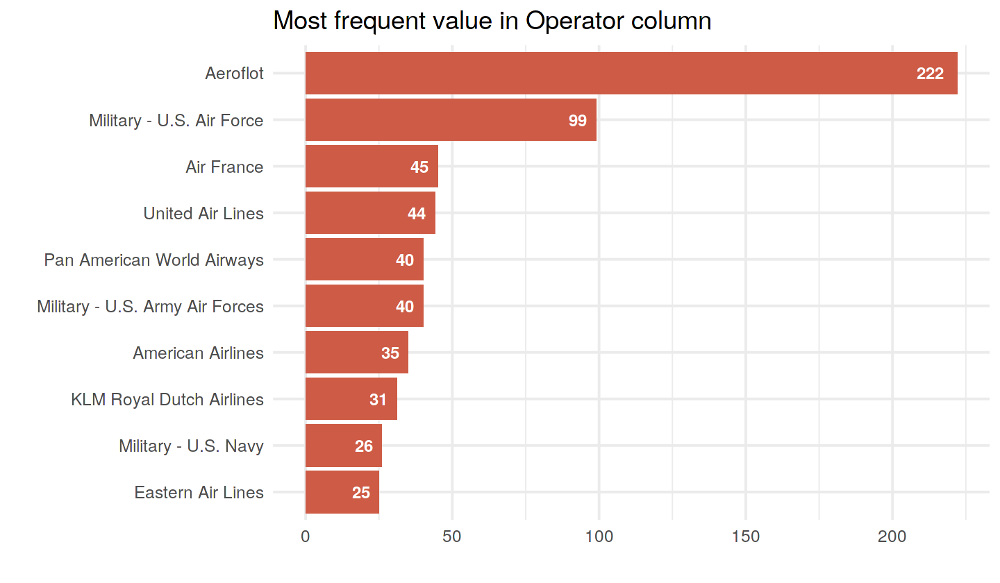

In [ ]:
# figure size
options(repr.plot.width = 12, repr.plot.height = 7)

# plot top 10 frequent values
ggplot(head(operator_wise, 10), aes(reorder(Operator, n) , n, fill = n))+
    geom_col(fill = 'coral3')+
    labs(title='Most frequent value in Operator column', x = '', y = '')+  
    geom_text(aes(label = n), hjust = 1.5, colour = "white", size = 5, fontface = "bold")+
    coord_flip()

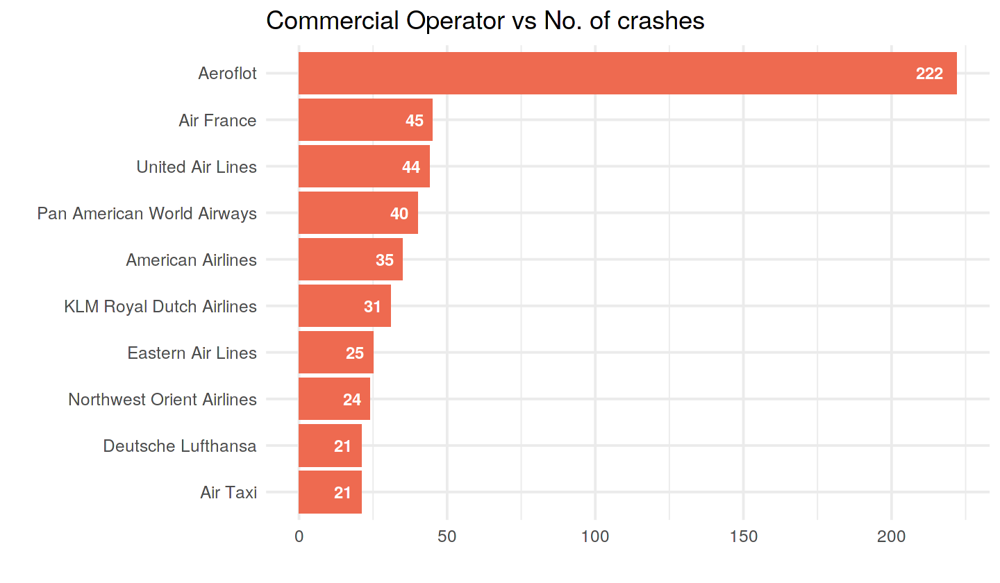

In [ ]:
# plot 'Commercial Operator vs No. of crashes'
ggplot(head(main_op_wise, 10), aes(reorder(main_op, n) , n, fill=n)) +
    geom_col(fill='coral2') +
    labs(title='Commercial Operator vs No. of crashes', x='', y='') +  
    geom_text(aes(label = n), hjust = 1.5, colour = "white", size = 5, fontface = "bold") +
    coord_flip()

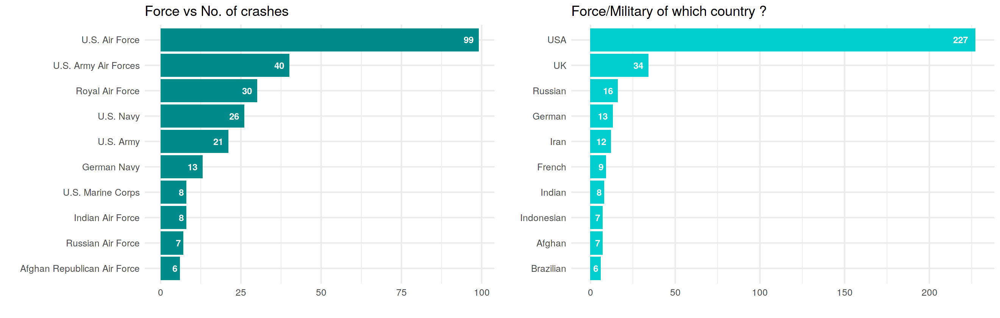

In [ ]:
# plot 'Force vs No. of crashes'
f <- ggplot(head(force, 10), aes(reorder(op, n) , n, fill = n))+
    geom_col(fill = 'cyan4')+
    labs(title = 'Force vs No. of crashes', x = '', y = '')+  
    geom_text(aes(label = n), hjust = 1.5, colour = "white", size = 5, fontface = "bold")+
    coord_flip()


# plot 'Which country's military/force'
fc <- ggplot(head(force_country, 10), aes(reorder(op, n) , n, fill = n))+
    geom_col(fill = 'cyan3')+
    labs(title = 'Force/Military of which country ?', x = '', y = '')+  
    geom_text(aes(label = n), hjust = 1.5, colour = "white", size = 5, fontface = "bold")+
    coord_flip()

# figure size
options(repr.plot.width = 22)

# plot
grid.arrange(f, fc, nrow = 1, widths = c(1, 1))

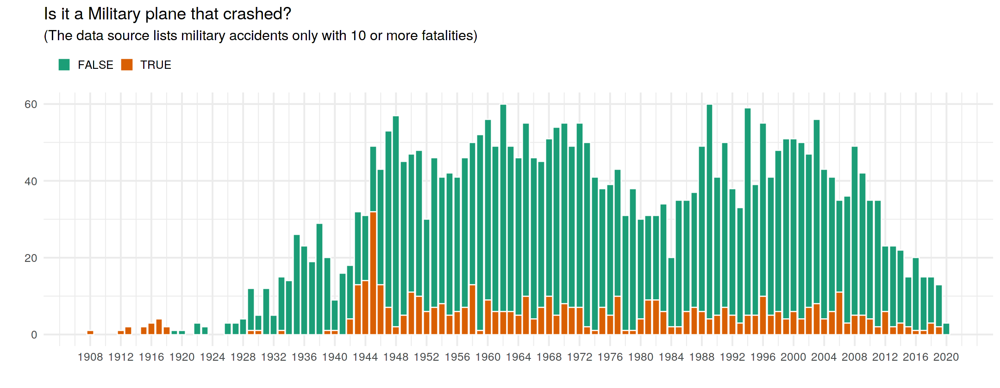

In [ ]:
# figure size
options(repr.plot.width = 18)

ggplot(yr_military, aes(x = Year, y = n, fill = Is_Military)) +
    geom_col(col = 'white') +
    labs(title = 'Is it a Military plane that crashed?', 
         subtitle = '(The data source lists military accidents only with 10 or more fatalities)',
         x = '', y = '', fill = '') +
    scale_x_continuous(breaks = seq(1908, 2020, 4)) + 
    scale_fill_brewer(palette = "Dark2") +
    theme(legend.position = "top", legend.justification = "left")

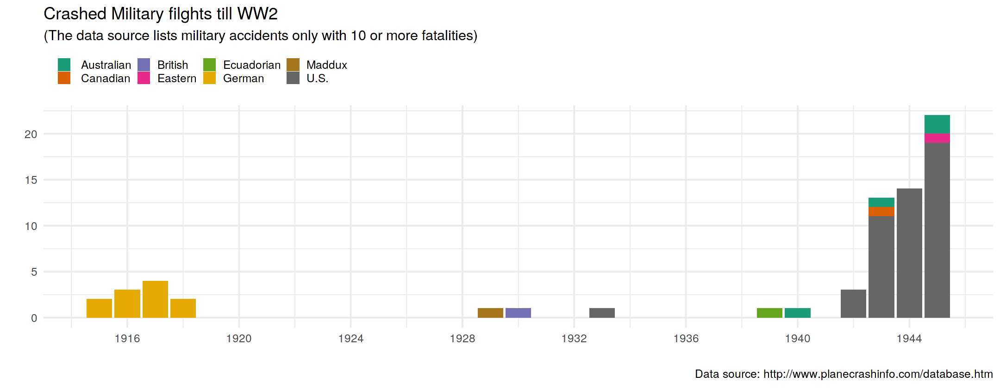

In [ ]:
# plot
ggplot(ww, aes(x = Year, y = n, fill = Operator)) +
    geom_col() +
    labs(title = 'Crashed Military filghts till WW2', 
         subtitle = '(The data source lists military accidents only with 10 or more fatalities)',
         caption = "Data source: http://www.planecrashinfo.com/database.htm",
         x = '', y = '', fill = '') +
    scale_x_continuous(breaks = seq(1908, 2010, 4)) + 
    scale_fill_brewer(palette = "Dark2") +
    theme(legend.position = "top", legend.justification = "left")

In [ ]:
# Non military, Non airlines

# df %>%
#     select(Operator) %>%
#     filter(!str_detect(Operator, 'Military|military')) %>%
#     filter(!str_detect(Operator, 'Air|Aero|Avia')) %>%
#     group_by(Operator) %>%
#     summarize(n = n()) %>%
#     arrange(desc(n)) %>%
#     head()

## 4. Exploring Route

Route can be of the format 
> *    Source - Destination
> *    Source - Connecting Airports - Destination 
> *     ... 

In [ ]:
# pie chart - training, sightseeing, test, other
# map - scatter plot - take off one color - landing one color
# map - lines from take-off and landing

In [ ]:
# group by route column
# =====================

route_wise <- df %>%
    group_by(Route) %>%
    summarize(n=n()) %>%
    arrange(desc(n)) 

# first few rows
# head(route_wise)

`summarise()` ungrouping output (override with `.groups` argument)



In [ ]:
# 'No. of crashes by non-commercial flights during ...'
# ===========================================================

non_pass <- df %>%
    # filter out empty strings
    filter(Route!='') %>%
    # filter out rows with '-', possibly a flying from one place to another separated by '-'
    filter(!str_detect(Route, ' ?- ?')) %>%
    # preprocess strings
    mutate(Route = str_replace(Route, 'Training.*', 'Training')) %>%
    mutate(Route = str_replace(Route, 'Test.*', 'Test flight')) %>%
    mutate(Route = str_replace(Route, '.*[Ss]ight ?s?eeing.*', 'Sightseeing')) %>%
    mutate(Route = str_replace(Route, 'Air ?[sS]how', 'Air Show')) %>%
    mutate(Route = str_replace(Route, 'Milit.?ary.*', 'Military exercise')) %>%
    mutate(Route = str_replace(Route, 'Sky ?[Dd]iving', 'Sky Diving')) %>%
    count(Route, sort = TRUE)

head(non_pass)

Route,n
<chr>,<int>
Training,63
Sightseeing,33
Test flight,18
Demonstration,4
Military exercise,2
Patrol,2


In [ ]:
take_off_dest <- df %>%
    select('Route') %>%
    filter(Route!='') %>%
    filter(str_detect(Route, ' ?- ?')) %>%
    mutate(Take_Off = str_extract(Route, '[^-]* ?-?')) %>%
    mutate(Take_Off = str_replace(Take_Off, ' -', ''))%>%
    mutate(Destination = str_extract(Route, '- ?[^-]*$')) %>%
    mutate(Destination = str_replace(Destination, '- ?', ''))

head(take_off_dest)

Route,Take_Off,Destination
<chr>,<chr>,<chr>
London - Paris,London,Paris
Miami - Bimini,Miami,Bimini
Croydon - Le Bourget,Croydon,Le Bourget
Strasbourg - Paris,Strasbourg,Paris
Paris - London,Paris,London
Paris - Berck-sur-Mer - Croydon,Paris,Croydon


In [ ]:
# most frequent route
route <- take_off_dest %>% count(Route, sort = TRUE)
head(route)

# most frequent take off location
take_off <- take_off_dest %>% count(Take_Off, sort = TRUE)
head(take_off)

# most frequent destination location
dest <- take_off_dest %>% count(Destination, sort = TRUE)
head(dest)

Route,n
<chr>,<int>
Sao Paulo - Rio de Janeiro,7
Paris - London,4
Rio de Janeiro - Sao Paulo,4
Barrow - Wainwright,3
Burbank - Oakland,3
Honolulu - San Francisco,3


Take_Off,n
<chr>,<int>
Moscow,39
New York City,38
Paris,34
London,33
Rome,31
Chicago,24


Destination,n
<chr>,<int>
Paris,37
Moscow,36
London,31
Los Angeles,31
New York City,27
Chicago,21


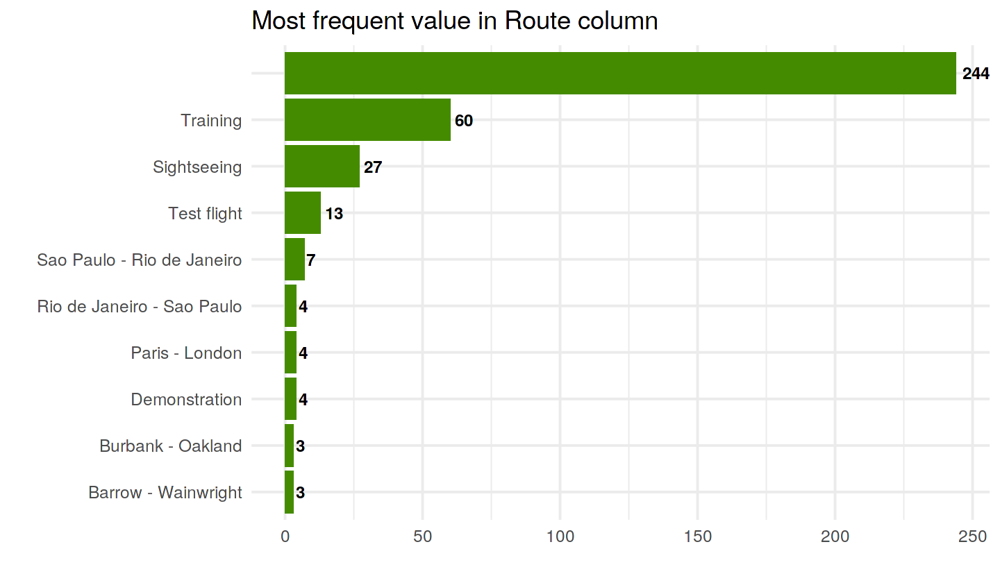

In [ ]:
# figure size
options(repr.plot.width = 12)

# plot 'Most frequent value in Route column'
ggplot(head(route_wise, 10), aes(reorder(Route, n) , n, fill=n))+
    geom_col(fill='chartreuse4')+
    labs(title='Most frequent value in Route column', x='', y='')+  
    geom_text(aes(label=n), hjust = -0.25, colour="black", size=5, fontface="bold")+
    coord_flip()

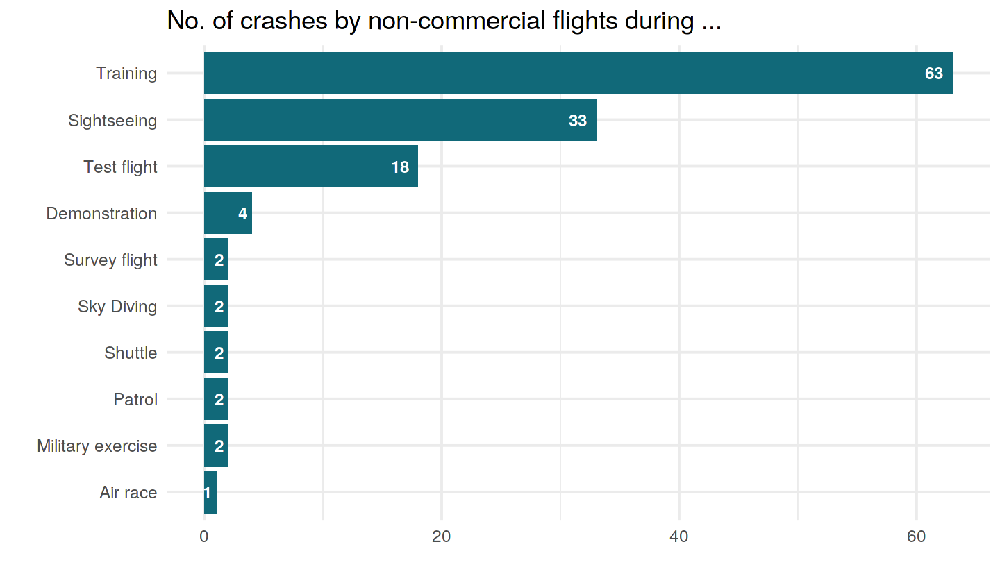

In [ ]:
# plot 'No. of crashes by non-commercial flights during ...'

ggplot(head(non_pass, 10), aes(reorder(Route, n) , n, fill=n))+
    geom_col(fill='#116979')+
    labs(title='No. of crashes by non-commercial flights during ...', x='', y='')+  
    geom_text(aes(label=n), hjust = 1.5, colour="white", size=5, fontface="bold")+
    coord_flip()

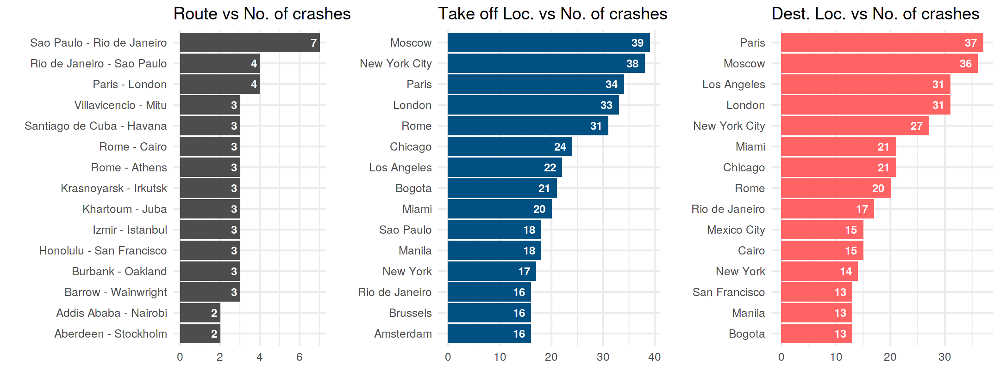

In [ ]:
# plot 'Route vs No. of crashes'
r <- ggplot(head(route, 15), aes(reorder(Route, n) , n, fill=n))+
    geom_col(fill='gray30')+
    labs(title='Route vs No. of crashes', x='', y='')+  
    geom_text(aes(label=n), hjust = 1.5, colour="white", size=5, fontface="bold")+
    coord_flip()

# plot 'Take off vs No. of crashes'
t <- ggplot(head(take_off, 15), aes(reorder(Take_Off, n) , n, fill=n))+
    geom_col(fill='#005082')+
    labs(title='Take off Loc. vs No. of crashes', x='', y='')+  
    geom_text(aes(label=n), hjust = 1.5, colour="white", size=5, fontface="bold")+
    coord_flip()

# plot 'Route vs No. of crashes'
d <- ggplot(head(dest, 15), aes(reorder(Destination, n) , n, fill=n))+
    geom_col(fill='#ff6363')+
    labs(title='Dest. Loc. vs No. of crashes', x='', y='')+  
    geom_text(aes(label=n), hjust = 1.5, colour="white", size=5, fontface="bold")+
    coord_flip()

# plot
options(repr.plot.width = 18)
grid.arrange(r,t,d, nrow = 1, widths=c(1,1,1))

## 5. Crash Location

In [ ]:
# to do 
# =====

# map - scatter plot 
# map - choropleth plot
# map - us state wise
# percentage in US
# treemap - worldmap
# treemap - us states

In [ ]:
# Most frequent value in crash location
# =====================================

loc_wise <- df %>%
    group_by(Location) %>%
    summarize(n=n()) %>%
    arrange(desc(n))

# head(loc_wise)

`summarise()` ungrouping output (override with `.groups` argument)



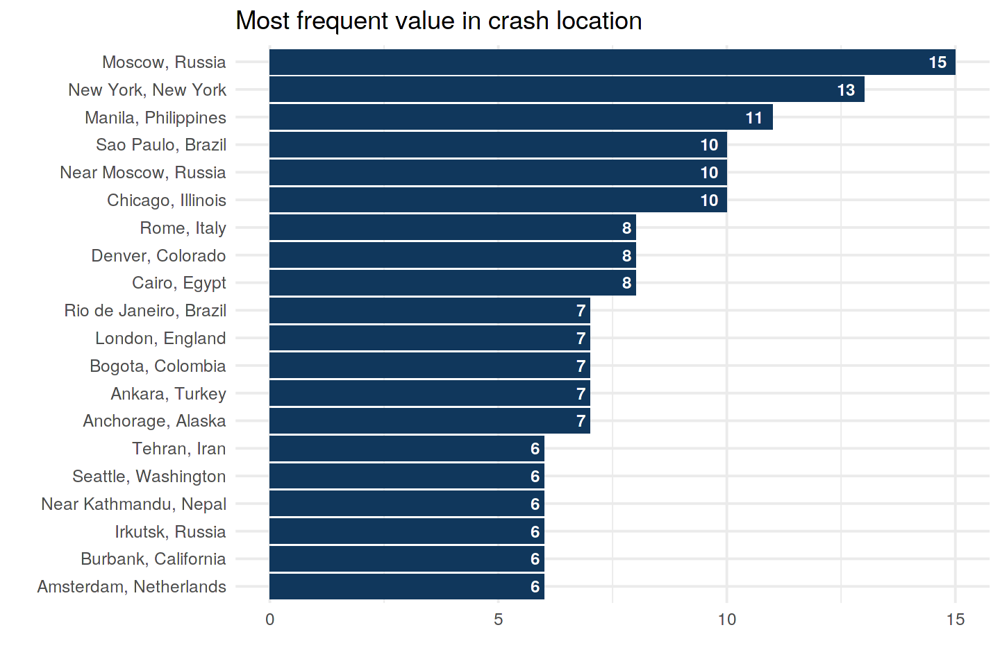

In [ ]:
# plot size
options(repr.plot.width = 12, repr.plot.height = 8)

# plot first few values
ggplot(head(loc_wise, 20), aes(reorder(Location, n) , n, fill=n))+
    geom_bar(stat="identity", fill='#10375c')+
    labs(title='Most frequent value in crash location', x='', y='')+  
    geom_text(aes(label=n), hjust = 1.5, colour="white", size=5, fontface="bold")+
    coord_flip()

In [ ]:
# rows with the word 'over'
df %>%
    select(Location) %>%
    filter(str_detect(Location, '^[Oo]ver')) %>%
    head()

# rows without character ','
df %>%
    select(Location) %>%
    filter(!str_detect(Location, ',')) %>%
    filter(!Location == '') %>%
    group_by(Location) %>%
    summarize(n=n()) %>%
    arrange(desc(n)) %>%
    head()

Location
<chr>
Over the North Sea
Over the Mediterranean
Over the North Atlantic
Over the Pacific Ocean
Over the Mediterranean Sea
Over the North Pacific Ocean


`summarise()` ungrouping output (override with `.groups` argument)



Location,n
<chr>,<int>
North Atlantic Ocean,5
North Sea,4
Gulf of Mexico,3
North Pacific Ocean,3
Atlantic Ocean,2
English Channel,2


In [ ]:
# ocean
df %>%
    select(Location) %>%
    filter(str_detect(Location, '[Oo]cean')) %>%
    mutate(Ocean = str_replace(Location, 'i[Oo]cean', 'ic Ocean')) %>%
    mutate(Ocean = str_extract(Ocean, '[A-Za-z]* Ocean')) %>%
    select(Ocean) %>%
    group_by(Ocean) %>%
    summarize(n=n()) %>%
    arrange(desc(n)) %>%
    drop_na() %>%
    head()

# sea
df %>%
    select(Location) %>%
    filter(str_detect(Location, '\\b[Ss]ea\\b')) %>%
    mutate(Sea = str_extract(Location, '[A-Za-z]* [Ss]ea')) %>%
    select(Sea) %>%
    group_by(Sea) %>%
    summarize(n=n())%>%
    arrange(desc(n)) %>%
    head()

# non-ocean, non-sea
df %>%
    select(Location) %>%
    filter(!Location == '') %>%
    filter(!str_detect(Location, ',')) %>%
    filter(!str_detect(Location, '[Oo]cean')) %>%
    filter(!str_detect(Location, '\\b[Ss]ea\\b')) %>%
    group_by(Location) %>%
    summarize(n=n()) %>%
    arrange(desc(n)) %>%
    head()

`summarise()` ungrouping output (override with `.groups` argument)



Ocean,n
<chr>,<int>
Atlantic Ocean,18
Pacific Ocean,14
Indian Ocean,2
Off Ocean,1


`summarise()` ungrouping output (override with `.groups` argument)



Sea,n
<chr>,<int>
North Sea,9
Mediterranean Sea,3
Java Sea,2
Aegean Sea,1
Andaman Sea,1
Baltic Sea,1


`summarise()` ungrouping output (override with `.groups` argument)



Location,n
<chr>,<int>
Gulf of Mexico,3
English Channel,2
175 miles off the Egyptian coast,1
Afghanistan,1
Alaska,1
Algeria,1


In [ ]:
# any water body

water_body <- df %>%
    select(Location) %>%
    filter(str_detect(Location, '[Oo]cean') |
           str_detect(Location, ' [Ss]ea') | 
           str_detect(Location, ' [Cc]hannel') | 
           str_detect(Location, '[Gg]ulf of') |
           str_detect(Location, '[Ss]hore')) %>%
    filter(!str_detect(Location, 'Oceanside')) %>%
    filter(!str_detect(Location, 'Near Sea')) %>%
    mutate(Water_Body = str_replace(Location, 'Over the ', '')) %>%
    mutate(Water_Body = str_replace(Water_Body, 'i[Oo]cean', 'ic Ocean')) %>%
    mutate(Water_Body = str_replace(Water_Body, '.*Atlantic Ocean.*', 'Atlantic Ocean')) %>%
    mutate(Water_Body = str_replace(Water_Body, '.*Pacific Ocean.*', 'Pacific Ocean')) %>%
    mutate(Water_Body = str_replace(Water_Body, '.*Indian Ocean.*', 'Indian Ocean')) %>%
    mutate(Water_Body = str_replace(Water_Body, '.*,(.* Sea)', '\\1')) %>%
    mutate(Water_Body = str_replace(Water_Body, '(.* Sea).*', '\\1')) %>%
    mutate(Water_Body = str_replace(Water_Body, '.* (Gulf of .*),.*', '\\1')) %>%
    mutate(Water_Body = str_replace(Water_Body, '.*Channel.*', 'English Channel')) %>%
    mutate(Water_Body = str_replace(Water_Body, '.*North Sea.*', 'North Sea')) %>%
    mutate(Type = str_replace(Water_Body, '.*(Ocean|Sea|Gulf|Channel).*', '\\1')) %>%
    group_by(Type, Water_Body) %>%
    summarize(n=n()) %>%
    arrange(desc(n))

head(water_body)

`summarise()` regrouping output by 'Type' (override with `.groups` argument)



Type,Water_Body,n
<chr>,<chr>,<int>
Ocean,Atlantic Ocean,18
Ocean,Pacific Ocean,14
Sea,North Sea,9
Channel,English Channel,6
Gulf,Gulf of Mexico,3
Sea,Mediterranean Sea,3


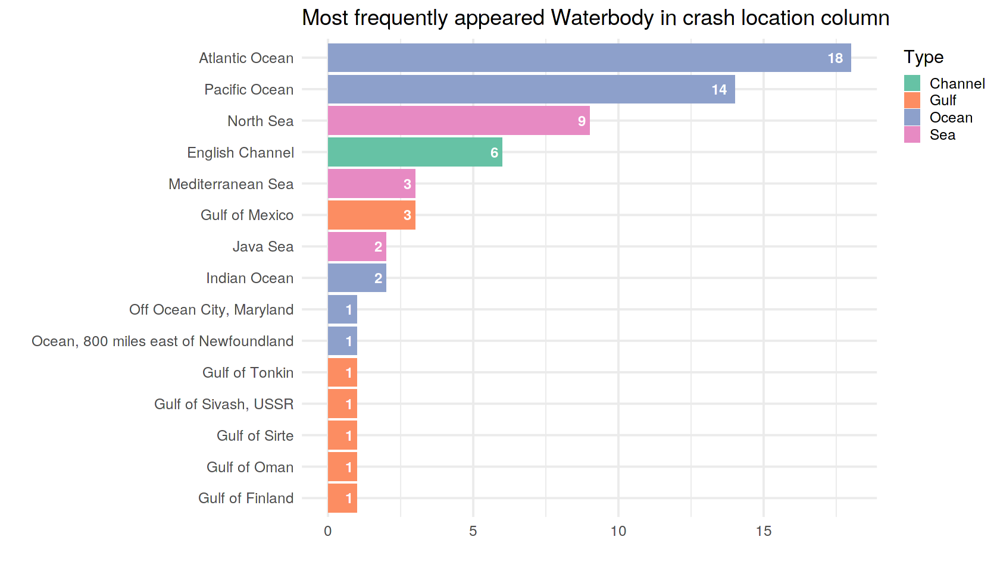

In [ ]:
# plot size
options(repr.plot.width = 14, repr.plot.height = 8)

# plot
ggplot(head(water_body, 15), aes(reorder(Water_Body, n), n, fill = Type)) +
    geom_bar(stat = "identity") +
    labs(title = 'Most frequently appeared Waterbody in crash location column', x = '', y = '') +  
    geom_text(aes(label = n), hjust = 1.5, colour = "white", size = 5, fontface = "bold") +
    coord_flip() +
    scale_fill_brewer(palette = "Set2") +
    theme(legend.position = "right", legend.justification = "top")

In [ ]:
# replace US states names 'State_Name' to 'State_Name, USA' format
states_list <- c('Alabama','Alaska','Alaksa','Arizona','Arkansas',"California",
                 "Colorado", "Connecticut","Delaware","Florida","Georgia",
                 "Hawaii","Idaho","Illinois", "Indiana","Iowa","Kansas",
                 "Kentucky","Louisiana","Maine","Maryland", "Massachusetts",
                 "Massachusett", "Michigan","Minnesota","Mississippi","Missouri",
                 "Montana", "Nebraska","Nevada","New Hampshire","New Jersey",
                 "New Mexico","New York", "North Carolina","North Dakota","Ohio",
                 "Oklahoma", "Oklohoma", "Oregon","Pennsylvania", "Rhode Island",
                 "South Carolina",
                 "South Dakota",'Tennesee',"Tennessee","Texas","Utah", "Vermont",
                 'Virginia',"Washington D.C.", "Washington, D.C.", "Washington", 
                 "West Virginia","Wisconsin","Wyoming",
                 "AL", "AK", "AZ", "AR", "CA", "CO", "CT", "DC", "DE", "FL", "GA",
                 "HI", "ID", "IL", "IN", "IA", "KS", "KY", "LA", "ME", "MD",
                 "MA", "MI", "MN", "MS", "MO", "MT", "NE", "NV", "NH", "NJ",
                 "NM", "NY", "NC", "ND", "OH", "OK", "OR", "PA", "RI", "SC",
                 "SD", "TN", "TX", "UT", "VT", "VA", "WA", "WV", "WI", "WY")

location <- df %>%
    select(Location) 

for(state in states_list) {
    location <- location %>%
        mutate(Location = str_replace_all(Location, state, paste(state, ', USA', sep = ''))) %>%
        mutate(Location = str_replace_all(Location, 'USA.*, ', '')) %>%
        mutate(Location = str_replace(Location, 'West Virginia, USA,', '')) %>%
        mutate(Location = str_replace(Location, 'Afghanstan', 'Afghanistan')) %>%
        mutate(Location = str_replace(Location, 'Airzona|Arazona', 'Arizona')) %>%
        mutate(Location = str_replace(Location, 'Alakska', 'Alaska')) %>%
        mutate(Location = str_replace(Location, 'Cailifornia|Calilfornia', 'California')) %>%
        mutate(Location = str_replace(Location, 'D.*Congo', 'DR Congo')) %>%
        mutate(Location = str_replace(Location, 'Domincan Republic', 'Dominican Republic')) %>%
        mutate(Location = str_replace(Location, 'Hati', 'Haiti')) %>%
        mutate(Location = str_replace(Location, ' International Airport', '')) %>%
        mutate(Location = str_replace(Location, 'Morrocco|Morroco', 'Morocco')) %>%
        mutate(Location = str_replace(Location, 'Phillipines', 'Phillipines')) %>%
        mutate(Location = str_replace(Location, 'Burma', 'Myanmar')) %>%
        mutate(Location = str_replace(Location, '([Ss]outhern|[Nn]orthern|[Ww]estern|[Ee]astern) ', ''))}

head(location)

Location
<chr>
"Fort Myer, Virginia, USA"
"Atlantic City, New Jersey, USA"
Over the North Sea
"Near Johannisthal, Germany"
"Tienen, Belgium"
"Off Cuxhaven, Germany"


In [ ]:
# extract state and country name from location

country_state <- location %>%
    select(Location) %>%
    filter(!str_detect(Location, '[Oo]cean|[Ss]ea|[Cc]hannel|Gulf of')) %>%
    mutate(Location = str_replace(Location, '(Near|Off|Over) ', '')) %>%
    mutate(Location = str_replace(Location, 'USA, Australia', 'Australia')) %>%
    mutate(State_Province = str_replace(Location, '(.*, )?(.*), (.*)', '\\2')) %>%
    mutate(Country = str_replace(Location, '.*,\\s*', '')) 

sample_n(country_state, 6)

Location,State_Province,Country
<chr>,<chr>,<chr>
"Carajas, Brazil",Carajas,Brazil
"Col de Tourniol, France",Col de Tourniol,France
"Cary, North Carolina, USA",North Carolina,USA
"Akron, Ohio, USA",Ohio,USA
"Omsukchan, Russia",Omsukchan,Russia
"Yenice, Turkey",Yenice,Turkey


In [ ]:
# most frequent location
# ======================

loc <- country_state %>%
    group_by(Location) %>%
    summarize(n = n()) %>%
    arrange(desc(n))

head(loc)

# most frequent State/Province/City
# =================================

st <- country_state %>%
    group_by(State_Province) %>%
    summarize(n = n()) %>%
    arrange(desc(n))

head(st)

# most frequent Country/Region
# ============================

cntry <- country_state %>%
    group_by(Country) %>%
    summarize(n = n()) %>%
    arrange(desc(n))

head(cntry)

`summarise()` ungrouping output (override with `.groups` argument)



Location,n
<chr>,<int>
"Moscow, Russia",25
"New York, USA",18
"Manila, Philippines",14
"Sao Paulo, Brazil",12
"Bogota, Colombia",11
"Chicago, Illinois, USA",11


`summarise()` ungrouping output (override with `.groups` argument)



State_Province,n
<chr>,<int>
California,97
Alaska,92
New York,53
Texas,38
Colorado,30
Florida,29


`summarise()` ungrouping output (override with `.groups` argument)



Country,n
<chr>,<int>
USA,851
Russia,218
Colombia,103
Brazil,99
Canada,89
France,88


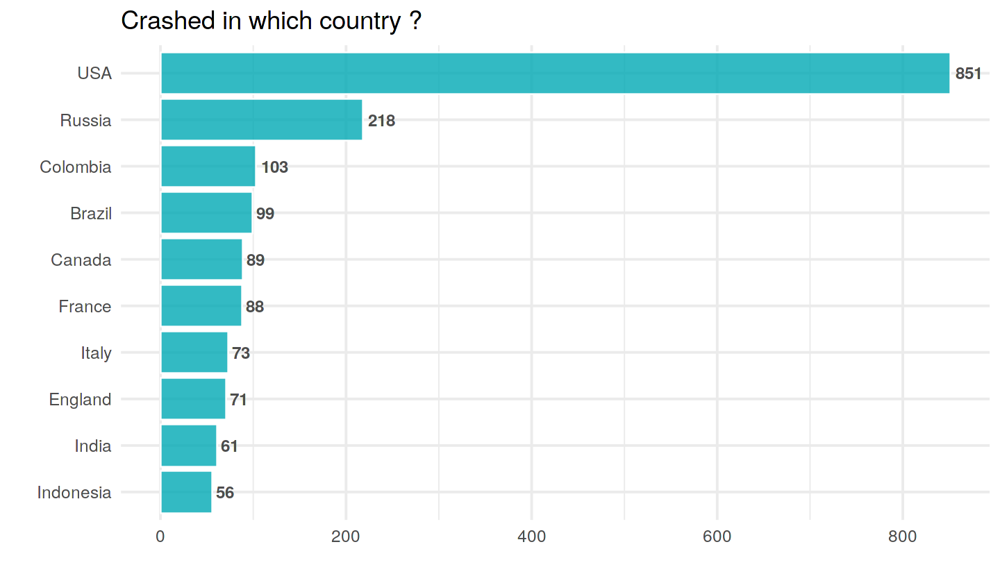

In [ ]:
# plot
options(repr.plot.width = 12, repr.plot.height = 7)

# plot
ggplot(head(cntry, 10), aes(reorder(Country, n), n)) +
    geom_bar(stat = "identity", fill = '#01a9b4', col = 'white', alpha = 0.8) +
    labs(title = 'Crashed in which country ?', x = '', y = '') +  
    geom_text(aes(label = n), hjust = -0.2, colour = "grey30", size = 5, fontface = "bold") +
    coord_flip()

In [ ]:
# group by country
state_cntry <- country_state %>%
    group_by(Country, State_Province) %>%
    summarize(n = n()) %>%
    arrange(desc(n))

head(state_cntry)

`summarise()` regrouping output by 'Country' (override with `.groups` argument)



Country,State_Province,n
<chr>,<chr>,<int>
USA,California,97
USA,Alaska,92
USA,New York,52
USA,Texas,38
USA,Colorado,30
USA,Florida,29


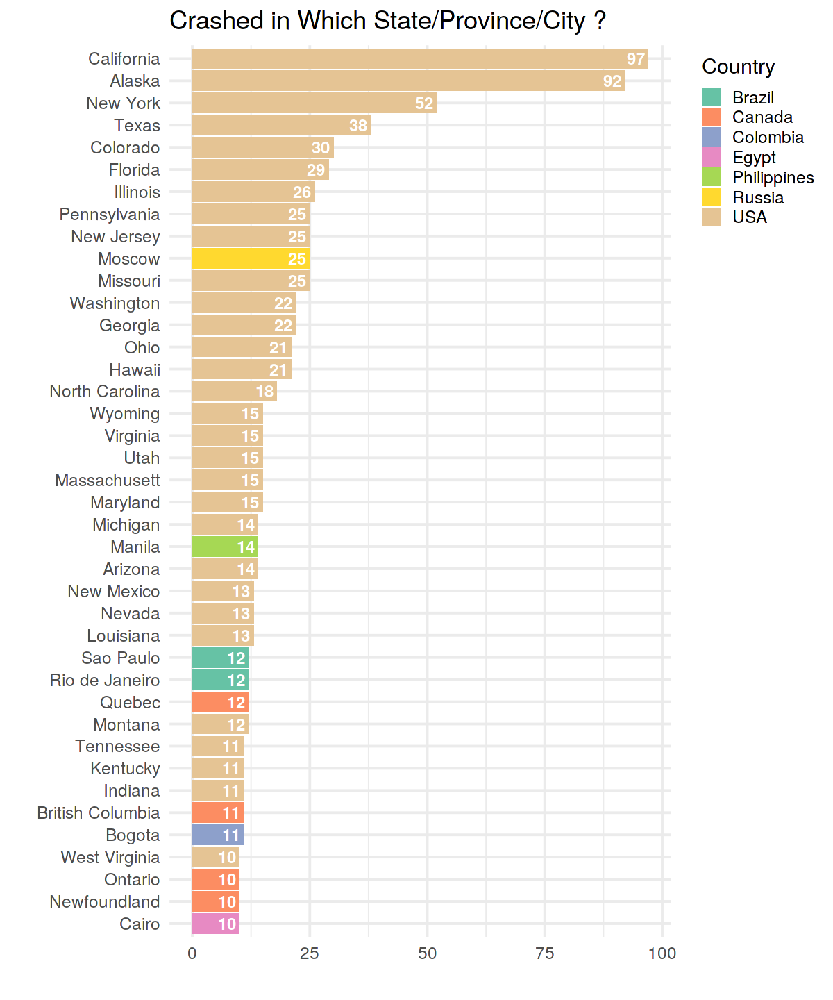

In [ ]:
# plot size
options(repr.plot.width = 10, repr.plot.height = 12)

# plot
ggplot(head(state_cntry, 40), aes(reorder(State_Province, n), n, fill = Country)) +
    geom_bar(stat = "identity") +
    labs(title = 'Crashed in Which State/Province/City ?', x = '', y = '') +  
    geom_text(aes(label = n), hjust = 1.2, colour = "white", size = 5, fontface = "bold") +
    coord_flip() +
    scale_fill_brewer(palette = "Set2") +
    theme(legend.position = "right", legend.justification = "top")

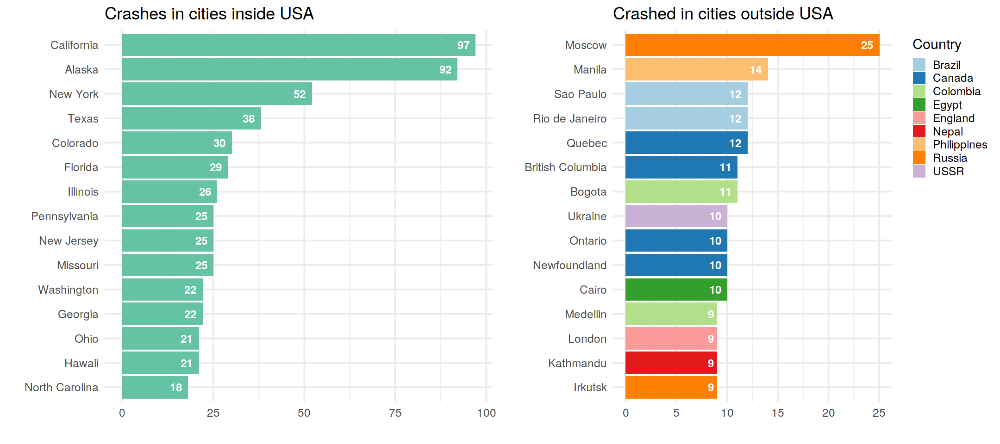

In [ ]:
us_locs <- state_cntry %>%
    filter(Country=='USA')

non_us_locs <- state_cntry %>%
    filter(Country!='USA')

# plot
us_graph <- ggplot(head(us_locs, 15), aes(reorder(State_Province, n), n, fill = Country)) +
    geom_bar(stat = "identity") +
    labs(title = 'Crashes in cities inside USA', x = '', y = '') +  
    geom_text(aes(label = n), hjust = 1.5, colour = "white", size = 5, fontface = "bold") +
    coord_flip() +
    scale_fill_brewer(palette = "Set2") +
    theme(legend.position = "none") 

# plot
non_us_graph <- ggplot(head(non_us_locs, 15), aes(reorder(State_Province, n), n, fill = Country)) +
    geom_bar(stat = "identity") +
    labs(title = 'Crashed in cities outside USA ', x = '', y = '') +  
    geom_text(aes(label = n), hjust = 1.5, colour = "white", size = 5, fontface = "bold") +
    coord_flip() +
    scale_fill_brewer(palette = "Paired") +
    theme(legend.position = "right", legend.justification = "top")

# plot
options(repr.plot.width = 18, repr.plot.height = 8)
grid.arrange(us_graph, non_us_graph, nrow = 1, widths = c(1, 1))

### Here is Why Are There So Many Airplane Crashes in Alaska?  

> " *Because the distances are vast, the terrain often impassable, and the road network rudimentary, Alaskan life is held together by a small-plane aviation system in a way that has no counterpart in the rest of the country.* " - https://www.theatlantic.com/technology/archive/2010/08/why-are-there-so-many-airplane-crashes-in-alaska/61275/

> "*Harsh weather and rough terrain. Storms are especially common in the Aleutian Islands, the Alaska Peninsula, and southern Alaska, with wind speeds of more than 50 miles an hour. Large swaths of the state are also jagged and mountainous, with mountaintops frequently obscured by clouds.*" - https://slate.com/news-and-politics/2010/08/why-do-so-many-planes-crash-in-alaska.html

## 6. Geographical distribution of crashes

In [ ]:
# world map
# ===========

# count data
# ==========
cntry <- cntry %>%
    mutate(m = case_when(
        n > 200  ~ "200 +",
        n < 200 & n >= 100 ~ "199 - 100",
        n < 100 & n >= 50 ~ "99 - 50",
        n < 50 & n >= 10 ~ "49 - 10",
        n < 10  ~ "< 10")) %>%
    mutate(m = factor(m, levels = c("< 10", "49 - 10", "99 - 50", "199 - 100", "200 +")))
head(cntry)

# map data
# ========
world_map <- map_data("world")
head(world_map)
# unique(world_map$region)

# missing data
# ============
# setdiff(unique(cntry$Country),  unique(world_map$region))

# join data
# =========
map_data <- cntry %>% 
    full_join(world_map, by = c('Country' = 'region')) 
head(map_data)

Country,n,m
<chr>,<int>,<fct>
USA,851,200 +
Russia,218,200 +
Colombia,103,199 - 100
Brazil,99,99 - 50
Canada,89,99 - 50
France,88,99 - 50


,long,lat,group,order,region,subregion
,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>
1,-69.89912,12.45200,1,1,Aruba,NA
2,-69.89571,12.42300,1,2,Aruba,NA
3,-69.94219,12.43853,1,3,Aruba,NA
4,-70.00415,12.50049,1,4,Aruba,NA
5,-70.06612,12.54697,1,5,Aruba,NA
6,-70.05088,12.59707,1,6,Aruba,NA


Country,n,m,long,lat,group,order,subregion
<chr>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<int>,<chr>
USA,851,200 +,-155.5813,19.01201,1443,91664,Hawaii
USA,851,200 +,-155.6256,18.96392,1443,91665,Hawaii
USA,851,200 +,-155.6808,18.96768,1443,91666,Hawaii
USA,851,200 +,-155.8813,19.07051,1443,91667,Hawaii
USA,851,200 +,-155.9056,19.12583,1443,91668,Hawaii
USA,851,200 +,-155.8907,19.38252,1443,91669,Hawaii


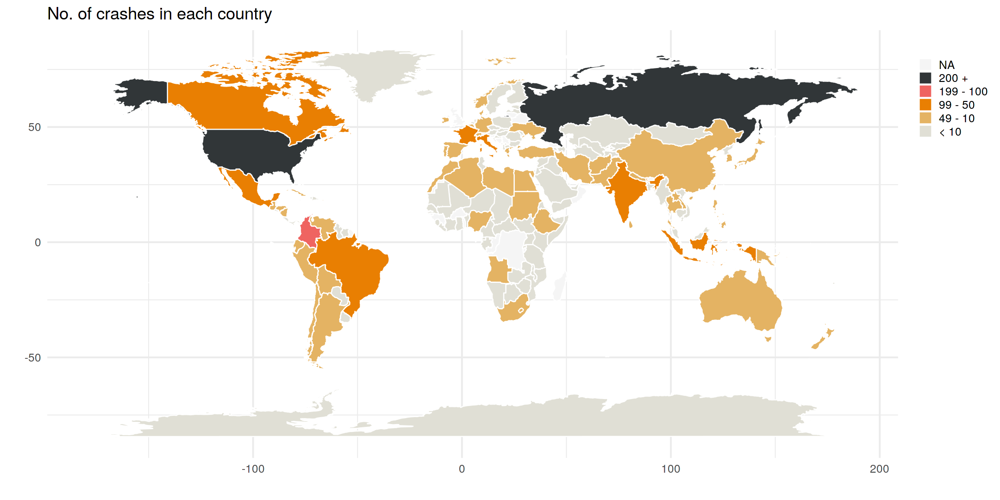

In [ ]:
# figure size
options(repr.plot.width = 18, repr.plot.height = 9)

# palette
map_pal = c("#E0DFD5", "#E4B363", "#E97F02", '#EF6461', '#313638')
# map_pal = c("#3FB8AF", "#7FC7AF", "#DAD8A7", '#FF9E9D', '#FF3D7F')

ggplot(map_data, aes(x = long, y = lat, group = group, fill = m)) +
    geom_polygon(colour = "white") + 
    labs(title = 'No. of crashes in each country', x = '', y = '', fill = '') +
    scale_fill_manual(values = map_pal, na.value = 'whitesmoke') + 
    theme(legend.position='right', legend.justification = "top") + 
    guides(fill = guide_legend(reverse = TRUE))

In [ ]:
# us states map
# ============

# count data
# ==========
us_count <- state_cntry %>%
    filter(Country=='USA') %>%
    mutate(m = case_when(
        n > 50  ~ "50 +",
        n < 50 & n >= 20 ~ "49 - 20",
        n < 20 & n >= 10 ~ "19 - 10",
        n < 10 & n >= 5 ~ "9 - 5",
        n < 5  ~ "< 5")) %>%
    mutate(m = factor(m, levels = c("< 5", "9 - 5", "19 - 10", "49 - 20", "50 +"))) 
head(us_count)
# unique(us_count$code)

# map data
# ========
us_states <- us_map()
head(us_states)
# unique(us_states$abbr)

# missing data
# ============
# setdiff(unique(us_count$State_Province), unique(us_states$full))

# join data
# =========
us_map_data <- us_count %>% 
    full_join(us_states, by = c('State_Province' = 'full')) 
head(us_map_data)
# unique(us_map_data$code)

Country,State_Province,n,m
<chr>,<chr>,<int>,<fct>
USA,California,97,50 +
USA,Alaska,92,50 +
USA,New York,52,50 +
USA,Texas,38,49 - 20
USA,Colorado,30,49 - 20
USA,Florida,29,49 - 20


,x,y,order,hole,piece,group,fips,abbr,full
,<dbl>,<dbl>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>,<chr>
1,1091779,-1380695,1,FALSE,1,01.1,01,AL,Alabama
2,1091268,-1376372,2,FALSE,1,01.1,01,AL,Alabama
3,1091140,-1362998,3,FALSE,1,01.1,01,AL,Alabama
4,1090940,-1343517,4,FALSE,1,01.1,01,AL,Alabama
5,1090913,-1341006,5,FALSE,1,01.1,01,AL,Alabama
6,1090796,-1334480,6,FALSE,1,01.1,01,AL,Alabama


Country,State_Province,n,m,x,y,order,hole,piece,group,fips,abbr
<chr>,<chr>,<int>,<fct>,<dbl>,<dbl>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>
USA,California,97,50 +,-2026180,-196213.7,2344,FALSE,1,06.1,06,CA
USA,California,97,50 +,-2014495,-181659.7,2345,FALSE,1,06.1,06,CA
USA,California,97,50 +,-1998811,-164891.2,2346,FALSE,1,06.1,06,CA
USA,California,97,50 +,-1989611,-150620.0,2347,FALSE,1,06.1,06,CA
USA,California,97,50 +,-1988345,-144054.4,2348,FALSE,1,06.1,06,CA
USA,California,97,50 +,-1989446,-139177.5,2349,FALSE,1,06.1,06,CA


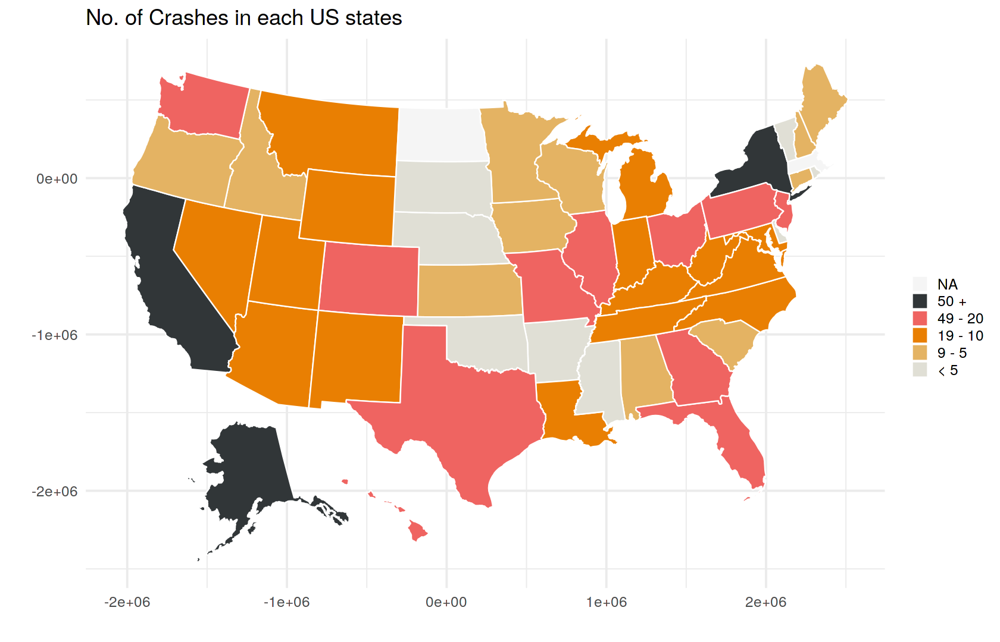

In [ ]:
# figure size
options(repr.plot.width = 14, repr.plot.height = 9)

# palette
# map_pal = c("#3FB8AF", "#7FC7AF", "#DAD8A7", '#FF9E9D', '#FF3D7F')

ggplot(us_map_data, aes(x = x, y = y, group = group, fill = m)) +
    geom_polygon(colour = "white") + 
    labs(title = 'No. of Crashes in each US states', x = '', y = '', fill = '') +
    scale_fill_manual(values = map_pal, na.value = 'whitesmoke') + 
    guides(fill = guide_legend(reverse = TRUE))

## 8. Crashes and deaths

In [ ]:
fig <- plot_ly(data = df, x = ~Date, y = ~Total_Fatalities, 
        size = ~Total_Fatalities, text = ~Summary,
        type = 'scatter', mode = 'markers')
fig <- fig %>% layout(title = 'Crash vs No. of Fatalities', 
                      xaxis = list(title = "Year"), 
                      yaxis = list(title = "No. of Fatalities"))
fig

Warning message:
“`arrange_()` is deprecated as of dplyr 0.7.0.
Please use `arrange()` instead.
See vignette('programming') for more help
This warning is displayed once every 8 hours.
Call `lifecycle::last_warnings()` to see where this warning was generated.”
Warning message:
“`line.width` does not currently support multiple values.”
Warning message:
“`line.width` does not currently support multiple values.”


HTML widgets cannot be represented in plain text (need html)

## 7. Network Diagram

In [ ]:
# take_off_dest_cnt <- take_off_dest %>% 
#     group_by(Take_Off, Destination) %>%
#     summarize(n = n())

In [ ]:
# # Plot
# p <- simpleNetwork(take_off_dest_cnt, Source = 1, Target = 2, height="100px", width="100px")

# p

## 8. Wordcloud

Warning message in tm_map.SimpleCorpus(text, toSpace, "/"):
“transformation drops documents”
Warning message in tm_map.SimpleCorpus(text, toSpace, "\\|"):
“transformation drops documents”
Warning message in tm_map.SimpleCorpus(text, toSpace, "@"):
“transformation drops documents”
Warning message in tm_map.SimpleCorpus(text, content_transformer(tolower)):
“transformation drops documents”
Warning message in tm_map.SimpleCorpus(text, removeWords, stopwords("english")):
“transformation drops documents”
Warning message in tm_map.SimpleCorpus(text, removeWords, sw):
“transformation drops documents”
Warning message in tm_map.SimpleCorpus(text, removePunctuation):
“transformation drops documents”
Warning message in tm_map.SimpleCorpus(text, removeNumbers):
“transformation drops documents”
Warning message in tm_map.SimpleCorpus(text, stripWhitespace):
“transformation drops documents”


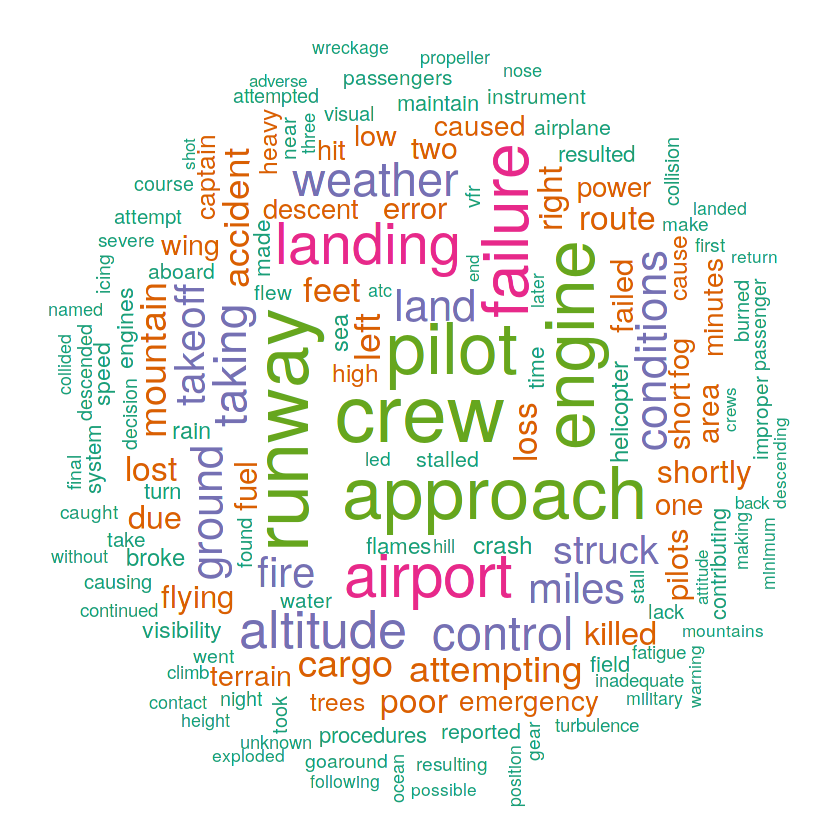

In [ ]:
text <- Corpus(VectorSource(df$Summary))
toSpace <- content_transformer(function(x, pattern) gsub(pattern," ",x))
                               
sw <- c("air", "airlines", "aircraft", "flight", "plane", "crashed") 
                               
text <- tm_map(text, toSpace, "/")
text <- tm_map(text, toSpace, "\\|")
text <- tm_map(text, toSpace, "@")
text <- tm_map(text, content_transformer(tolower))
text <- tm_map(text, removeWords, stopwords("english"))
text <- tm_map(text, removeWords, sw)
text <- tm_map(text, removePunctuation)
text <- tm_map(text, removeNumbers)
text <- tm_map(text, stripWhitespace)  
                               
dtm <- TermDocumentMatrix(text)
m <- as.matrix(dtm)
s <- sort(rowSums(m), decreasing = TRUE)
d <- data.frame(word = names(s), freq = s)                               
                               
options(repr.plot.width = 7, repr.plot.height = 7)
wordcloud(words = d$word, 
          freq = d$freq, 
          max.words = 150, 
          min.freq = 5, 
          random.order = FALSE, 
          rot.per = 0.35, 
          colors = brewer.pal(5, "Dark2"))                               

## Topic modelling

In [ ]:
# table of custom stop words
custom_sw <- tribble(
    ~word,      ~lexicon,
    "air",   "CUSTOM",
    "airlines",   "CUSTOM",
    "aircraft",   "CUSTOM",
    "plane",   "CUSTOM",
    "flight",   "CUSTOM", 
    "crew",   "CUSTOM", 
    "passenger",   "CUSTOM")

# new table of stop words
stop_words <- stop_words %>%
  bind_rows(custom_sw)

In [ ]:
tidy_summary <- df %>%
    select(Summary) %>%
    sample_n(100) %>%
    drop_na(Summary) %>%
    unnest_tokens(output = "word", token = "words", input = Summary) %>%
    anti_join(stop_words)

head(tidy_summary)

# Document term matrix
# ====================

dtm_reivew <- tidy_summary %>%
  mutate(id = row_number()) %>% 
  count(word, id) %>%
  cast_dtm(id, word, n) %>%
  as.matrix()

# dtm_reivew

Joining, by = "word"



word
<chr>
cargo
crashed
attempt
pilot
terrain
poor


<span id="papermill-error-cell" style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">Execution using papermill encountered an exception here and stopped:</span>

In [ ]:
lda_out_3 <- 
  LDA(dtm_reivew, k = 4, method = 'Gibbs', control = list(seed = 2)) %>%
  tidy(matrix = "beta")

word_probs <- lda_out_3 %>%
  group_by(topic) %>%
  top_n(15, beta) %>%
  ungroup() %>%
  mutate(term2 = fct_reorder(term , beta))

options(repr.plot.width = 14, repr.plot.height = 10)

ggplot(word_probs, aes(term2, beta, fill = as.factor(topic))) +
    geom_col(show.legend = FALSE) +
    facet_wrap(~ topic, scales = "free") +
    labs(title = "Topic modeling") +
    coord_flip() +
    scale_fill_brewer(palette = "Set2") 

ERROR: Error in LDA(dtm_reivew, k = 4, method = "Gibbs", control = list(seed = 2)): could not find function "LDA"


## 9. Other columns

In [ ]:
colnames(df)

[1] "Date"                  "Time"                  "Location"             
 [4] "Operator"              "Flight"                "Route"                
 [7] "Type"                  "Registration"          "cn/ln"                
[10] "Total_Aboard"          "Passengers_Aboard"     "Crew_Aboard"          
[13] "Total_Fatalities"      "Passengers_Fatalities" "Crew_Fatalities"      
[16] "Ground"                "Summary"               "Year"                 
[19] "Month"                 "Day"                   "Weekday"              
[22] "Week_no"               "Quarter"               "Is_Leap_Year"         
[25] "Decade"                "Hour"                  "Minute"               
[28] "AM_PM"                 "btwn_6PM_6AM"

In [ ]:
df['Flight'] %>%
    table() %>%
    as.data.frame() %>%
    arrange(desc(Freq)) %>%
    head()

,.,Freq
,<fct>,<int>
1,,2172
2,-,35
3,1,11
4,101,9
5,4,7
6,6,7


In [ ]:
df['cn/ln'] %>%
    table() %>%
    as.data.frame() %>%
    arrange(desc(Freq)) %>%
    head()

,.,Freq
,<fct>,<int>
1,,294
2,125,6
3,103,4
4,178,4
5,195,4
6,229,4


In [ ]:
df['Date'] %>%
    table() %>%
    as.data.frame() %>%
    arrange(desc(Freq)) %>%
    head()

,.,Freq
,<fct>,<int>
1,2001-09-11,4
2,1944-06-06,3
3,1946-12-25,3
4,1947-05-29,3
5,1958-09-02,3
6,1962-03-08,3


## 10. Per no. of passengers and takeoffs

In [ ]:
crash_year <- df %>%
    select(Year, Total_Fatalities) %>%
    group_by(Year) %>%
    summarize(No_of_crashes = n(), 
              No_of_fatalities = sum(Total_Fatalities))

head(crash_year)

`summarise()` ungrouping output (override with `.groups` argument)



Year,No_of_crashes,No_of_fatalities
<dbl>,<int>,<int>
1908,1,1
1912,1,5
1913,2,44
1915,2,40
1916,3,61
1917,4,81


In [ ]:
dept <- read.csv('..//input/air-passengers-and-departures-data-from-19702018/departures_count_long.csv') %>%
    as_tibble() %>%
    group_by(Year) %>%
    summarize(No_of_Departures=sum(Count))

head(dept)

`summarise()` ungrouping output (override with `.groups` argument)



Year,No_of_Departures
<int>,<int>
1970,9483400
1971,9538600
1972,9572500
1973,9792300
1974,9283700
1975,9290200


In [ ]:
pasn <- read.csv('..//input/air-passengers-and-departures-data-from-19702018/passengers_count_long.csv') %>%
    as_tibble() %>%
    group_by(Year) %>%
    summarize(No_of_Passengers=sum(as.numeric(Count)))

head(pasn)

`summarise()` ungrouping output (override with `.groups` argument)



Year,No_of_Passengers
<int>,<dbl>
1970,311098992
1971,332422904
1972,366478708
1973,402508700
1974,422271800
1975,433856900


In [ ]:
temp <- dept %>%
    left_join(pasn, by = c('Year')) %>%
    left_join(crash_year, by = c('Year')) %>%
    mutate(dep_in_million = No_of_Departures/1000000) %>%
    mutate(pas_in_million = No_of_Passengers/1000000) %>%
    mutate(crashes_per_mil_dep = No_of_crashes/dep_in_million) %>%
    mutate(deathes_per_mil_pas = No_of_fatalities/pas_in_million)

head(temp)

Year,No_of_Departures,No_of_Passengers,No_of_crashes,No_of_fatalities,dep_in_million,pas_in_million,crashes_per_mil_dep,deathes_per_mil_pas
<dbl>,<int>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
1970,9483400,311098992,55,1689,9.4834,311.0990,5.799608,5.429140
1971,9538600,332422904,49,1634,9.5386,332.4229,5.137022,4.915425
1972,9572500,366478708,55,2455,9.5725,366.4787,5.745625,6.698888
1973,9792300,402508700,50,2140,9.7923,402.5087,5.106053,5.316655
1974,9283700,422271800,41,1946,9.2837,422.2718,4.416343,4.608406
1975,9290200,433856900,38,1344,9.2902,433.8569,4.090332,3.097796


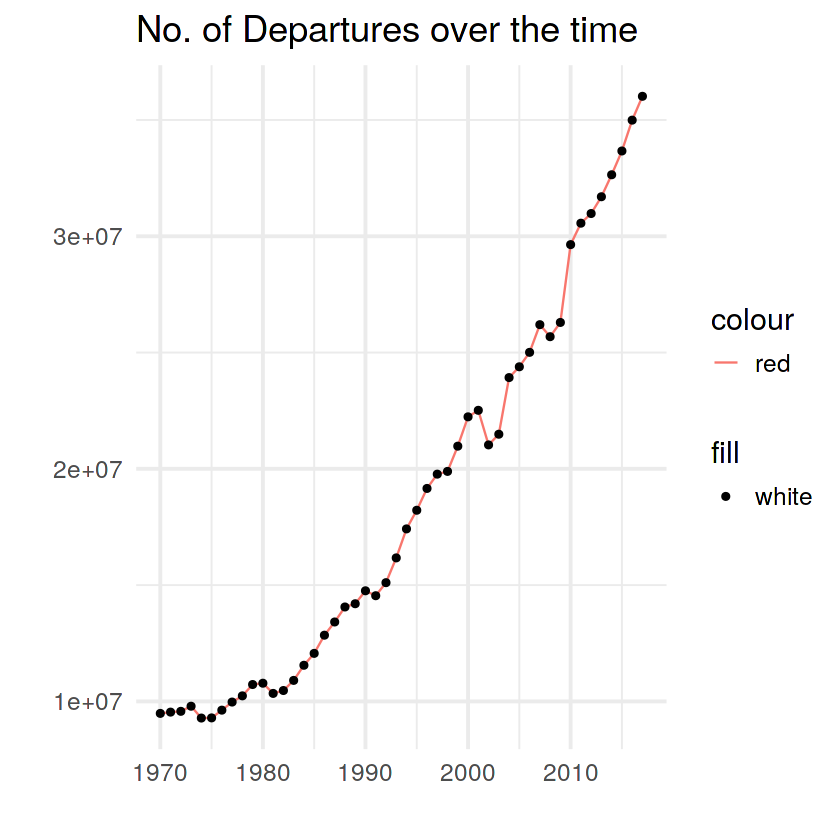

In [ ]:
ggplot(temp) +
    geom_line(aes(Year, No_of_Departures, color='red')) +
    geom_point(aes(Year, No_of_Departures, fill='white')) +
    labs(title = 'No. of Departures over the time', x = '', y = '')

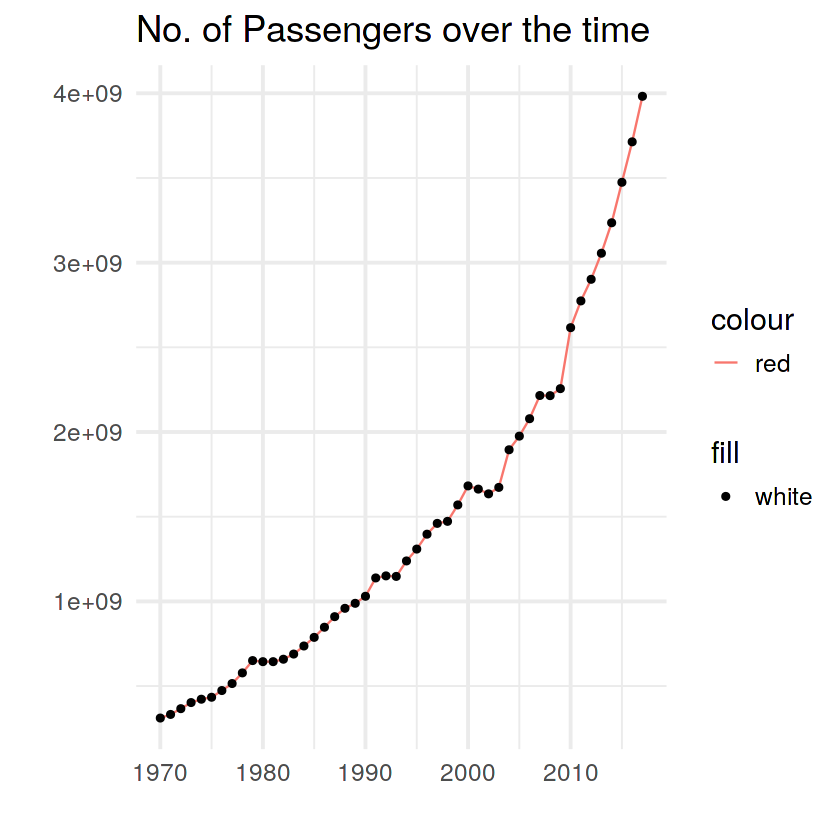

In [ ]:
ggplot(temp) +
    geom_line(aes(Year, No_of_Passengers, color='red')) +
    geom_point(aes(Year, No_of_Passengers, fill='white')) +
    labs(title = 'No. of Passengers over the time', x = '', y = '')

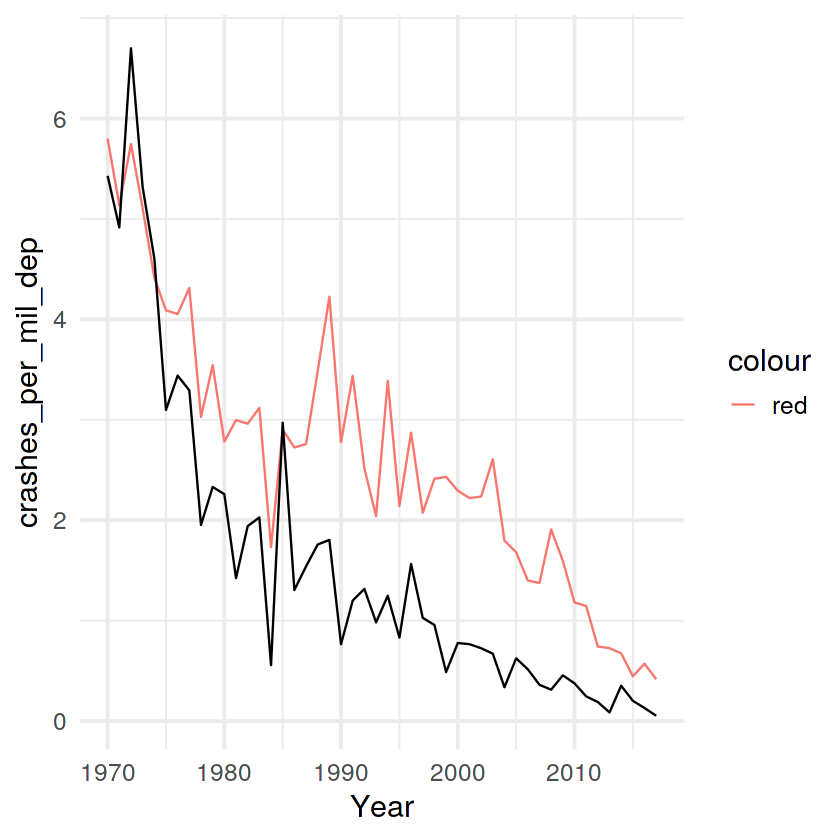

In [ ]:
ggplot(temp) +
    geom_line(aes(Year, crashes_per_mil_dep, color='red')) + 
    geom_line(aes(Year, deathes_per_mil_pas))

> * The notebook is only intended for project purpose to learn R, regular expressions, tidyverse packages, ggplot, plotly, lubridate and other packages along with exploring the dataset and plotting meaningful visualizations.